<h1><center> CAPSTONE PROJECT: LOAN DEFAULT PREDICTION</center>

**PROBLEM STATEMENT** : To develop a predicive model to identify the likelihood of loan default by borrowers based on historical data and borrower characteristics.

**OBJECTIVE :**

The banking sector faces a substantial challenge in mitigating the risk of loan defaults, which can inflict significant financial damage. The present methods of assessing loan default, while effective to a certain extent, often lack the precision required to preemptively identify potential defaulters. This is where the transformative potential of machine learning comes into play. By harnessing the power of advanced algorithms and predictive models, machine learning holds the promise of significantly enhancing loan default predictions. By analyzing an array of historical data and crucial factors, such as credit scores, employment history, and payment behavior, these models have the capacity to more accurately categorize borrowers into potential default and non-default groups.

**FEATURE DESCRIPTION**


**1. id:** This column appears to be an identifier for each entry in the dataset. It likely serves as a unique identifier for each record.

**2. member_id:** Another identifier, possibly representing a unique identifier for members associated with each loan.

**3. loan_amnt:** This column represents the amount of the loan requested by the borrower.

**4. funded_amnt:** The actual amount of the loan funded by the lender to the borrower.

**5. funded_amnt_inv:** The amount of the loan funded by investors.

**6. term:** The term length of the loan, usually in months.

**7. int_rate:** The interest rate on the loan, represented as a percentage.

**8. installment:** The monthly payment owed by the borrower.

**9. emp_length:** The length of time the borrower has been employed.

**10. home_ownership:** The type of home ownership (e.g., RENT, OWN, MORTGAGE).

**11. annual_inc:** The borrower's annual income.

**12. verification_status:** Indicates whether the income of the borrower was verified by the platform.

**13. issue_d:** The date the loan was issued.

**14. loan_status:** The current status of the loan (e.g., Current, Fully Paid, Charged Off).

**15. purpose:** The purpose of the loan as stated by the borrower.
    
**16. title:** A title provided by the borrower for the loan request.

**17. zip_code:** The first three digits of the borrower's zip code.

**18. addr_state:** The state of the borrower's address.

**19. dti:** Debt-to-Income ratio, representing the borrower's total monthly debt payments divided by their gross monthly income.

**20. delinq_2yrs:** The number of 30+ days past due delinquencies in the borrower's credit file.

**21. earliest_cr_line:** The date the borrower's earliest reported credit line was opened.

**22. inq_last_6mths:** The number of inquiries by creditors in the last 6 months.

**23. open_acc:** The number of open credit lines in the borrower's credit file.

**24. pub_rec:** The number of derogatory public records (bankruptcy filings, tax liens, or judgments) on the borrower's credit report.

**25. revol_bal:** Total credit-revolving balance (balance unpaid at the end of the credit card billing cycle).

**26. revol_util:** Revolving line utilization rate, or the amount of credit the borrower is using relative to their total available revolving credit.

**27. total_acc:** The total number of credit lines currently in the borrower's credit file.

**28. total_pymnt:** Total amount paid to date.

**29. total_pymnt_inv:** Total amount paid to date by investors.

**30. total_rec_prncp:** Total principal received to date.

**31. total_rec_int:** Total interest received to date.

**32. last_pymnt_d:** Last month payment was received.

**33. last_pymnt_amnt:** Last total payment amount received.

**34. next_pymnt_d:** Next scheduled payment date.

**35. last_credit_pull_d:** The most recent month LC pulled credit for this loan.

**36. repay_fail:** A binary indicator (0 or 1) indicating if the loan repayment failed.    

# -----------------------------------------------------------------------------------

## IMPORT LIBRARIES :

In [1]:
#pip install klib

In [2]:
#pip install chart-studio

In [161]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as pe
import scipy.stats as st

from warnings import filterwarnings

pd.options.display.max_columns=None
pd.options.display.max_rows= None

pd.options.display.float_format= '{:.6f}'.format

from sklearn.model_selection import train_test_split

from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error

from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression

import statsmodels
import statsmodels.api as sm
import statsmodels.stats.api as sms
from statsmodels.compat import lzip
from statsmodels.stats.outliers_influence import variance_inflation_factor 
from statsmodels.graphics.gofplots import qqplot
from statsmodels.stats.anova import anova_lm
from statsmodels.formula.api import ols
from statsmodels.tools.eval_measures import rmse

from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler

import math

# import various functions from sklearn decision tree and random forest
from sklearn.metrics import classification_report
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn import tree
from sklearn.model_selection import GridSearchCV


# import the functions for visualizing the decision tree
import pydotplus
from IPython.display import Image  


# For numeric continuous target variable
from sklearn.tree import DecisionTreeRegressor

import klib

from sklearn.impute import KNNImputer


from mlxtend.feature_selection import SequentialFeatureSelector as sfs
from sklearn.feature_selection import RFE

# import function to perform linear regression
from sklearn.linear_model import LinearRegression

# import functions to perform cross validation
from sklearn.model_selection import LeaveOneOut
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold

from sklearn.linear_model import LassoCV
from sklearn.linear_model import Lasso

import chart_studio.plotly as csp

from IPython.display import Markdown as md

from sklearn.tree import DecisionTreeRegressor


from sklearn.metrics import classification_report
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn import tree

from sklearn.ensemble import RandomForestRegressor

import pydotplus
from IPython.display import Image  

## IMPORT DATASET

In [162]:
df = pd.read_csv('Loan_Default_data.csv', encoding='latin-1')
df.head()

,Unnamed: 0,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,purpose,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,mths_since_last_delinq,open_acc,pub_rec,revol_bal,revol_util,total_acc,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,last_pymnt_d,last_pymnt_amnt,next_pymnt_d,last_credit_pull_d,repay_fail
0,2,2,2,0.000000,0.000000,0.000000,36 months,0.000000,0.000000,< 1 year,RENT,0.000000,Not Verified,Dec-99,Charged Off,major_purchase,000xx,ZZ,0.000000,0.000000,Jan-01,0.000000,NaN,0.000000,0.000000,0.000000,0.00%,1.000000,0.000000,0.000000,0.000000,0.000000,Jan-07,0.000000,Jan-07,Jan-07,1
1,3,545583,703644,2500.000000,2500.000000,2500.000000,36 months,13.980000,85.420000,4 years,RENT,20004.000000,Not Verified,Jul-10,Does not meet the credit policy. Status:Fully ...,other,487xx,MI,19.860000,0.000000,Aug-05,5.000000,NaN,7.000000,0.000000,981.000000,21.30%,10.000000,3075.291779,3075.290000,2500.000000,575.290000,Jul-13,90.850000,Aug-13,Jun-16,0
2,4,532101,687836,5000.000000,5000.000000,5000.000000,36 months,15.950000,175.670000,4 years,RENT,59000.000000,Not Verified,Jun-10,Charged Off,debt_consolidation,115xx,NY,19.570000,0.000000,Apr-94,1.000000,59.000000,7.000000,0.000000,18773.000000,99.90%,15.000000,2948.760000,2948.760000,1909.020000,873.810000,Nov-11,175.670000,NaN,Mar-12,1
3,5,877788,1092507,7000.000000,7000.000000,7000.000000,36 months,9.910000,225.580000,10+ years,MORTGAGE,53796.000000,Not Verified,Sep-11,Fully Paid,other,751xx,TX,10.800000,3.000000,Mar-98,3.000000,3.000000,7.000000,0.000000,3269.000000,47.20%,20.000000,8082.391880,8082.390000,7000.000000,1082.390000,Mar-14,1550.270000,NaN,Mar-14,0
4,6,875406,1089981,2000.000000,2000.000000,2000.000000,36 months,5.420000,60.320000,10+ years,RENT,30000.000000,Not Verified,Sep-11,Fully Paid,debt_consolidation,112xx,NY,3.600000,0.000000,Jan-75,0.000000,72.000000,7.000000,0.000000,0.000000,0%,15.000000,2161.663244,2161.660000,2000.000000,161.660000,Feb-14,53.120000,NaN,Jun-16,0


<h1> EXPLORATORY DATA ANALYSIS (EDA) </h1>

## UNDERSTANDING THE DATA

#### Let us now see the number of variables and observations in the data

In [163]:
df.shape

(38480, 37)

#### Give a concise summary of the DataFrame

In [164]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 38480 entries, 0 to 38479
Data columns (total 37 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Unnamed: 0              38480 non-null  int64  
 1   id                      38480 non-null  int64  
 2   member_id               38480 non-null  int64  
 3   loan_amnt               38479 non-null  float64
 4   funded_amnt             38479 non-null  float64
 5   funded_amnt_inv         38479 non-null  float64
 6   term                    38480 non-null  object 
 7   int_rate                38480 non-null  float64
 8   installment             38479 non-null  float64
 9   emp_length              37487 non-null  object 
 10  home_ownership          38480 non-null  object 
 11  annual_inc              38478 non-null  float64
 12  verification_status     38480 non-null  object 
 13  issue_d                 38480 non-null  object 
 14  loan_status             38480 non-null

#### Summary Statistics

In [165]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Unnamed: 0,38480.000000,19240.500000,11108.363516,1.000000,9620.750000,19240.500000,28860.250000,38480.000000
id,38480.000000,664997.930016,219232.159934,1.000000,498364.500000,644319.500000,826560.750000,1077430.000000
member_id,38480.000000,826189.854288,279353.137600,1.000000,638462.000000,824254.500000,1034706.500000,1314167.000000
loan_amnt,38479.000000,11094.727644,7405.416042,0.000000,5200.000000,9750.000000,15000.000000,35000.000000
funded_amnt,38479.000000,10831.856337,7146.853682,0.000000,5100.000000,9600.000000,15000.000000,35000.000000
funded_amnt_inv,38479.000000,10150.141518,7128.026828,0.000000,4950.000000,8495.792749,14000.000000,35000.000000
int_rate,38480.000000,12.164300,3.737440,0.000000,9.620000,11.990000,14.720000,100.990000
installment,38479.000000,323.163255,209.089097,0.000000,165.740000,277.980000,429.350000,1305.190000
annual_inc,38478.000000,68995.308917,64476.388744,0.000000,40000.000000,58650.000000,82000.000000,6000000.000000
dti,38480.000000,13.378119,6.744356,0.000000,8.200000,13.485000,18.690000,100.000000


#### Number of unique values in each column

In [166]:
df.nunique()

Unnamed: 0                38480
id                        38480
member_id                 38480
loan_amnt                   881
funded_amnt                1036
funded_amnt_inv            8473
term                          2
int_rate                    392
installment               15475
emp_length                   11
home_ownership                5
annual_inc                 5191
verification_status           3
issue_d                      57
loan_status                   9
purpose                      14
zip_code                    834
addr_state                   52
dti                        2878
delinq_2yrs                  11
earliest_cr_line            528
inq_last_6mths               28
mths_since_last_delinq       93
open_acc                     44
pub_rec                       6
revol_bal                 21470
revol_util                 1109
total_acc                    81
total_pymnt               36820
total_pymnt_inv           36374
total_rec_prncp            7907
total_re

#### Number of columns with categorical datatype 

In [167]:
df.select_dtypes(include = 'object').columns

Index(['term', 'emp_length', 'home_ownership', 'verification_status',
       'issue_d', 'loan_status', 'purpose', 'zip_code', 'addr_state',
       'earliest_cr_line', 'revol_util', 'last_pymnt_d', 'next_pymnt_d',
       'last_credit_pull_d'],
      dtype='object')

In [168]:
len(df.select_dtypes(include = 'object').columns)

14

#### Number of columns with numerical datatype 

In [169]:
df.select_dtypes(include = 'number').columns

Index(['Unnamed: 0', 'id', 'member_id', 'loan_amnt', 'funded_amnt',
       'funded_amnt_inv', 'int_rate', 'installment', 'annual_inc', 'dti',
       'delinq_2yrs', 'inq_last_6mths', 'mths_since_last_delinq', 'open_acc',
       'pub_rec', 'revol_bal', 'total_acc', 'total_pymnt', 'total_pymnt_inv',
       'total_rec_prncp', 'total_rec_int', 'last_pymnt_amnt', 'repay_fail'],
      dtype='object')

In [170]:
len(df.select_dtypes(include = 'number').columns)

23

#### Number of missing values in each column

In [171]:
df.isnull().sum()

Unnamed: 0                    0
id                            0
member_id                     0
loan_amnt                     1
funded_amnt                   1
funded_amnt_inv               1
term                          0
int_rate                      0
installment                   1
emp_length                  993
home_ownership                0
annual_inc                    2
verification_status           0
issue_d                       0
loan_status                   0
purpose                       0
zip_code                      0
addr_state                    0
dti                           0
delinq_2yrs                   1
earliest_cr_line              0
inq_last_6mths                1
mths_since_last_delinq    24363
open_acc                      1
pub_rec                       1
revol_bal                     4
revol_util                   59
total_acc                     1
total_pymnt                   1
total_pymnt_inv               1
total_rec_prncp               1
total_re

In [172]:
# Missing value percentage
null_percentages = (df.isna().sum() / len(df)) * 100
null_df = pd.DataFrame({'Column': null_percentages.index, 'Null Percentage': null_percentages.values})
null_df['Null Percentage'] = null_df['Null Percentage'].astype(float)
sorted_null_df = null_df.sort_values(by='Null Percentage', ascending=False)
sorted_null_df

,Column,Null Percentage
34,next_pymnt_d,91.208420
22,mths_since_last_delinq,63.313410
9,emp_length,2.580561
32,last_pymnt_d,0.184511
26,revol_util,0.153326
25,revol_bal,0.010395
35,last_credit_pull_d,0.007796
11,annual_inc,0.005198
8,installment,0.002599
33,last_pymnt_amnt,0.002599


#### Total number of missing values

In [173]:
df.isnull().sum().sum()

60606

**Conclusions :**

- There are 38480 rows and 37 columns (features)
- In features, there are 14 categorical datatypes and 23 numerical datatypes
- Total number of missing values is 60606 which contributes 22.5% of the total data 
- Features including 'mths_since_last_delinq' and 'next_pymnt_d' contains large number of missing values i.e. 24363 (9% of total data) and 35097 (13% of total data) respectively
- Feature i.e. 'emp_length' contains 993 missing values, 'revol_util' contains 59 missing values, 'last_pymnt_d' contains 71 missing values, 'revol_bal' contains 4 missing values, 'last_credit_pull_d' contains 3 missing values, 'annual_inc' contains 2 missing values while 'loan_amnt','funded_amnt','funded_amnt_inv','installment','delinq_2yrs','delinq_2yrs','inq_last_6mths','open_acc','pub_rec','total_acc','total_pymnt',
'total_pymnt_inv','total_rec_int','total_rec_prncp', and 'last_pymnt_amnt' contains 1 missing value


#### Since, around 15 columns contains 1 missing value, let us check whether they belong to the same row?

In [174]:
columns_to_check = ['loan_amnt','funded_amnt','funded_amnt_inv','installment','delinq_2yrs',\
                    'delinq_2yrs','inq_last_6mths','open_acc','pub_rec','total_acc','total_pymnt',\
                    'total_pymnt_inv','total_rec_int','total_rec_prncp','last_pymnt_amnt']

# Dictionary to store missing row indices for each column
missing_values_info = {}

for column in columns_to_check:
    missing_value_rows = df[df[column].isna()]
    missing_row_indices = missing_value_rows.index.tolist()
    missing_values_info[column] = missing_row_indices

for column, indices in missing_values_info.items():
    print(f"Rows with missing values in column '{column}': {indices}")

Rows with missing values in column 'loan_amnt': [54]
Rows with missing values in column 'funded_amnt': [54]
Rows with missing values in column 'funded_amnt_inv': [54]
Rows with missing values in column 'installment': [54]
Rows with missing values in column 'delinq_2yrs': [54]
Rows with missing values in column 'inq_last_6mths': [54]
Rows with missing values in column 'open_acc': [54]
Rows with missing values in column 'pub_rec': [54]
Rows with missing values in column 'total_acc': [54]
Rows with missing values in column 'total_pymnt': [54]
Rows with missing values in column 'total_pymnt_inv': [54]
Rows with missing values in column 'total_rec_int': [54]
Rows with missing values in column 'total_rec_prncp': [54]
Rows with missing values in column 'last_pymnt_amnt': [54]


#### Let us check for other columns having more than 1 missing value, whether one of them lies on row number 54?

In [175]:
columns_to_check1 = ['mths_since_last_delinq','last_credit_pull_d','emp_length','revol_util','last_pymnt_d',\
                   'revol_bal','last_credit_pull_d','annual_inc',]

row_number_to_check = 54

missing_or_not = pd.isna(df.loc[row_number_to_check, columns_to_check1])
print(missing_or_not)

mths_since_last_delinq    False
last_credit_pull_d        False
emp_length                False
revol_util                False
last_pymnt_d              False
revol_bal                  True
last_credit_pull_d        False
annual_inc                 True
Name: 54, dtype: bool


**Conclusion :**

- Row number 54 has missing values for 16 columns

## DATA CLEANING

**Following steps are to be done for data cleaning :**

1. **Feature selection using Filtering :** Removing irrelevant features
2. **Row deletion :** Removing irrelevant rows
3. **Date formatting :** Changing the dates into mm-yy format
4. **Removing special character :** Removing special characters to facilitate numerical analysis
5. **Text preprocessing :** Text cleaning to standardize numerical data

**1. Feature selection using Filtering :**
- Drop the IDs including 'Unnamed: 0', 'id', 'member_id'
- Drop the feature 'zip_code' as only first three of its digits are available
- Drop column 'mths_since_last_delinq' and 'next_pymnt_d' as they contains 63% & 91% missing data respectively (row wise)

In [176]:
df = df.drop(columns = ['Unnamed: 0', 'id', 'member_id','zip_code', 'mths_since_last_delinq','next_pymnt_d'])

In [177]:
df.shape

(38480, 31)

**2. Row deletion :**

- Dropping row number first as most of its values looks irrelevant with 0 & 1, along with row number fifty fourth as it has missing values for 16 columns

In [178]:
rows_to_delete = [0, 54]
df = df.drop(rows_to_delete, axis=0)
df.reset_index(drop=True, inplace=True)

In [179]:
df.head()

,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,purpose,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,open_acc,pub_rec,revol_bal,revol_util,total_acc,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,last_pymnt_d,last_pymnt_amnt,last_credit_pull_d,repay_fail
0,2500.000000,2500.000000,2500.000000,36 months,13.980000,85.420000,4 years,RENT,20004.000000,Not Verified,Jul-10,Does not meet the credit policy. Status:Fully ...,other,MI,19.860000,0.000000,Aug-05,5.000000,7.000000,0.000000,981.000000,21.30%,10.000000,3075.291779,3075.290000,2500.000000,575.290000,Jul-13,90.850000,Jun-16,0
1,5000.000000,5000.000000,5000.000000,36 months,15.950000,175.670000,4 years,RENT,59000.000000,Not Verified,Jun-10,Charged Off,debt_consolidation,NY,19.570000,0.000000,Apr-94,1.000000,7.000000,0.000000,18773.000000,99.90%,15.000000,2948.760000,2948.760000,1909.020000,873.810000,Nov-11,175.670000,Mar-12,1
2,7000.000000,7000.000000,7000.000000,36 months,9.910000,225.580000,10+ years,MORTGAGE,53796.000000,Not Verified,Sep-11,Fully Paid,other,TX,10.800000,3.000000,Mar-98,3.000000,7.000000,0.000000,3269.000000,47.20%,20.000000,8082.391880,8082.390000,7000.000000,1082.390000,Mar-14,1550.270000,Mar-14,0
3,2000.000000,2000.000000,2000.000000,36 months,5.420000,60.320000,10+ years,RENT,30000.000000,Not Verified,Sep-11,Fully Paid,debt_consolidation,NY,3.600000,0.000000,Jan-75,0.000000,7.000000,0.000000,0.000000,0%,15.000000,2161.663244,2161.660000,2000.000000,161.660000,Feb-14,53.120000,Jun-16,0
4,3600.000000,3600.000000,3600.000000,36 months,10.250000,116.590000,10+ years,MORTGAGE,675048.000000,Not Verified,Apr-10,Does not meet the credit policy. Status:Fully ...,other,AL,1.550000,0.000000,Apr-98,4.000000,8.000000,0.000000,0.000000,0%,25.000000,4206.031191,4206.030000,3600.000000,606.030000,May-13,146.750000,Jun-16,0


In [180]:
df.shape

(38478, 31)

**3. Date formatting :**

- Formatting the date of columns 'last_pymnt_d', 'next_pymnt_d', 'last_credit_pull_d' into mm-yy format

In [181]:
df.columns

Index(['loan_amnt', 'funded_amnt', 'funded_amnt_inv', 'term', 'int_rate',
       'installment', 'emp_length', 'home_ownership', 'annual_inc',
       'verification_status', 'issue_d', 'loan_status', 'purpose',
       'addr_state', 'dti', 'delinq_2yrs', 'earliest_cr_line',
       'inq_last_6mths', 'open_acc', 'pub_rec', 'revol_bal', 'revol_util',
       'total_acc', 'total_pymnt', 'total_pymnt_inv', 'total_rec_prncp',
       'total_rec_int', 'last_pymnt_d', 'last_pymnt_amnt',
       'last_credit_pull_d', 'repay_fail'],
      dtype='object')

In [182]:
def convert_date(date_str):
    try:
        if pd.isnull(date_str):
            print(f"Handling NaN value: {date_str}")
            return None  # Return None for NaN or None values
        date_str = str(date_str).strip()  # Ensure date_str is a string and strip whitespace
        if date_str == '':
            print(f"Handling empty string: '{date_str}'")
            return None  # Return None for empty strings
        # Convert the date string to a datetime object
        date = pd.to_datetime(date_str, format='%b-%y')
        # Format the datetime object to MM-YY
        formatted_date = date.strftime('%m-%y')
        print(f"Successfully converted: {date_str} to {formatted_date}")
        return formatted_date
    except ValueError:
        print(f"Handling invalid date format: {date_str}")
        return None  # Return None for invalid dates

# List of columns to apply the conversion to
date_columns = ['issue_d','earliest_cr_line','last_pymnt_d', 'last_credit_pull_d']

# Apply the conversion to the specified date columns
for col in date_columns:
    df[col] = df[col].apply(convert_date)


Successfully converted: Jul-10 to 07-10
Successfully converted: Jun-10 to 06-10
Successfully converted: Sep-11 to 09-11
Successfully converted: Sep-11 to 09-11
Successfully converted: Apr-10 to 04-10
Successfully converted: Oct-11 to 10-11
Successfully converted: May-11 to 05-11
Successfully converted: Nov-11 to 11-11
Successfully converted: Jun-11 to 06-11
Successfully converted: Nov-11 to 11-11
Successfully converted: Mar-09 to 03-09
Successfully converted: Jul-11 to 07-11
Successfully converted: Nov-10 to 11-10
Successfully converted: Aug-09 to 08-09
Successfully converted: Dec-10 to 12-10
Successfully converted: Oct-09 to 10-09
Successfully converted: Sep-09 to 09-09
Successfully converted: Jan-10 to 01-10
Successfully converted: Jul-09 to 07-09
Successfully converted: Jun-10 to 06-10
Successfully converted: Aug-09 to 08-09
Successfully converted: Jun-11 to 06-11
Successfully converted: Aug-11 to 08-11
Successfully converted: Apr-11 to 04-11
Successfully converted: Apr-11 to 04-11


In [183]:
df.head()

,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,purpose,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,open_acc,pub_rec,revol_bal,revol_util,total_acc,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,last_pymnt_d,last_pymnt_amnt,last_credit_pull_d,repay_fail
0,2500.000000,2500.000000,2500.000000,36 months,13.980000,85.420000,4 years,RENT,20004.000000,Not Verified,07-10,Does not meet the credit policy. Status:Fully ...,other,MI,19.860000,0.000000,08-05,5.000000,7.000000,0.000000,981.000000,21.30%,10.000000,3075.291779,3075.290000,2500.000000,575.290000,07-13,90.850000,06-16,0
1,5000.000000,5000.000000,5000.000000,36 months,15.950000,175.670000,4 years,RENT,59000.000000,Not Verified,06-10,Charged Off,debt_consolidation,NY,19.570000,0.000000,04-94,1.000000,7.000000,0.000000,18773.000000,99.90%,15.000000,2948.760000,2948.760000,1909.020000,873.810000,11-11,175.670000,03-12,1
2,7000.000000,7000.000000,7000.000000,36 months,9.910000,225.580000,10+ years,MORTGAGE,53796.000000,Not Verified,09-11,Fully Paid,other,TX,10.800000,3.000000,03-98,3.000000,7.000000,0.000000,3269.000000,47.20%,20.000000,8082.391880,8082.390000,7000.000000,1082.390000,03-14,1550.270000,03-14,0
3,2000.000000,2000.000000,2000.000000,36 months,5.420000,60.320000,10+ years,RENT,30000.000000,Not Verified,09-11,Fully Paid,debt_consolidation,NY,3.600000,0.000000,01-75,0.000000,7.000000,0.000000,0.000000,0%,15.000000,2161.663244,2161.660000,2000.000000,161.660000,02-14,53.120000,06-16,0
4,3600.000000,3600.000000,3600.000000,36 months,10.250000,116.590000,10+ years,MORTGAGE,675048.000000,Not Verified,04-10,Does not meet the credit policy. Status:Fully ...,other,AL,1.550000,0.000000,04-98,4.000000,8.000000,0.000000,0.000000,0%,25.000000,4206.031191,4206.030000,3600.000000,606.030000,05-13,146.750000,06-16,0


**4. Removing special character :**

- Removing '+', '<' signs from feature 'emp_length'
- Removing '%' sign from the feature 'revol_util'


In [184]:
df['emp_length'].value_counts()

emp_length
10+ years    8464
< 1 year     4564
2 years      4292
3 years      3939
4 years      3314
1 year       3254
5 years      3171
6 years      2144
7 years      1702
8 years      1445
9 years      1196
Name: count, dtype: int64

In [185]:
# Remove special characters from emp_length and convert it into numerical datatype
df['emp_length'] = df['emp_length'].str.extract('(\d+)').astype(float)

In [186]:
#df.head()

In [187]:
# Remove '%' sign from 'revol_util' and it into numerical datatype
df['revol_util'] = df['revol_util'].str.strip('%').astype(float)

In [188]:
#df.head()

**5. Text preprocessing :**
    
- Text cleaning by removing word 'months' from text column and converting it into numerical datatype    

In [189]:
# Remove string from 'term' feature and convert it into numerical datatype
df['term'] = df['term'].str.extract('(\d+)').astype(int)

In [190]:
#df.head()

In [191]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 38478 entries, 0 to 38477
Data columns (total 31 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   loan_amnt            38478 non-null  float64
 1   funded_amnt          38478 non-null  float64
 2   funded_amnt_inv      38478 non-null  float64
 3   term                 38478 non-null  int64  
 4   int_rate             38478 non-null  float64
 5   installment          38478 non-null  float64
 6   emp_length           37485 non-null  float64
 7   home_ownership       38478 non-null  object 
 8   annual_inc           38477 non-null  float64
 9   verification_status  38478 non-null  object 
 10  issue_d              38478 non-null  object 
 11  loan_status          38478 non-null  object 
 12  purpose              38478 non-null  object 
 13  addr_state           38478 non-null  object 
 14  dti                  38478 non-null  float64
 15  delinq_2yrs          38478 non-null 

## MISSING VALUE TREATMENT (DATA MODELLING)

<h3> MISSING VALUE PLOT </h3>

GridSpec(6, 6)

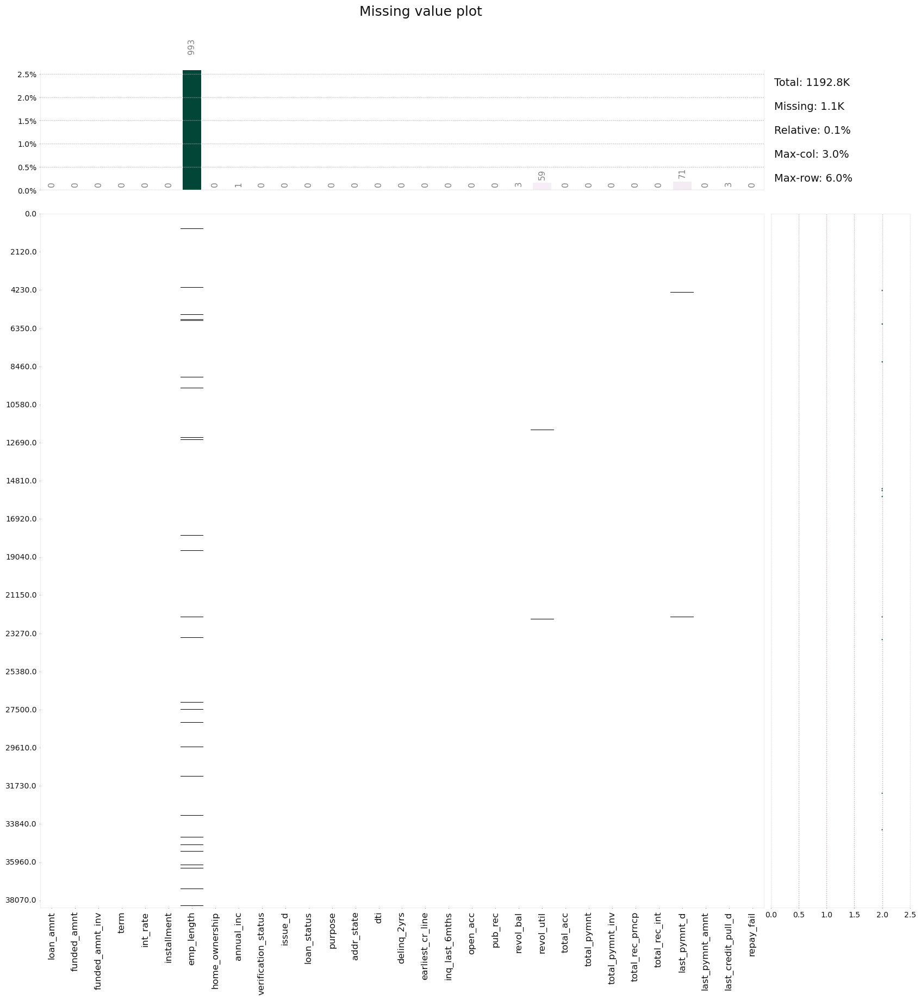

In [192]:
klib.missingval_plot(df)

### HEATMAP

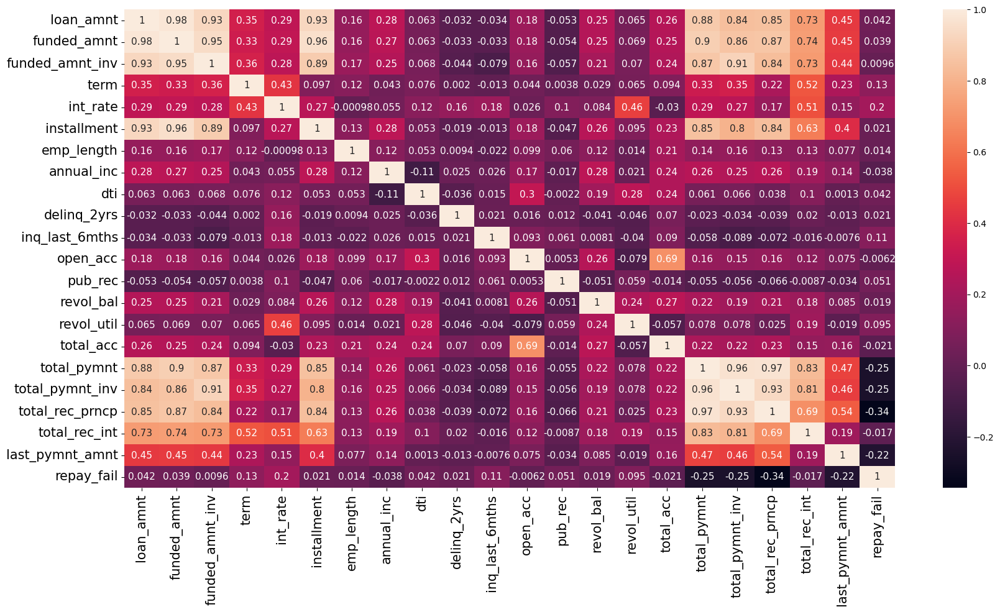

In [193]:
# set the plot size using figure()
# pass width and height in inches to 'figsize' 
plt.figure(figsize = (20,10))

# plot the heat map
# corr(): give the correlation matrix
# annot: prints the correlation values in the chart
# annot_kws: used to set the font size of the annotation
sns.heatmap(df.select_dtypes(include = 'number').corr(), annot = True, annot_kws = {"size": 11})

# rotation = 'horizontal' rotates the y-axis labels horizontally
# set text size using 'fontsize'
plt.yticks(rotation = 'horizontal', fontsize = 15)
plt.xticks(fontsize = 15)

# display the plot
plt.show()

### VARIABLES WITH SIGNIFICANT CORRELATIONS

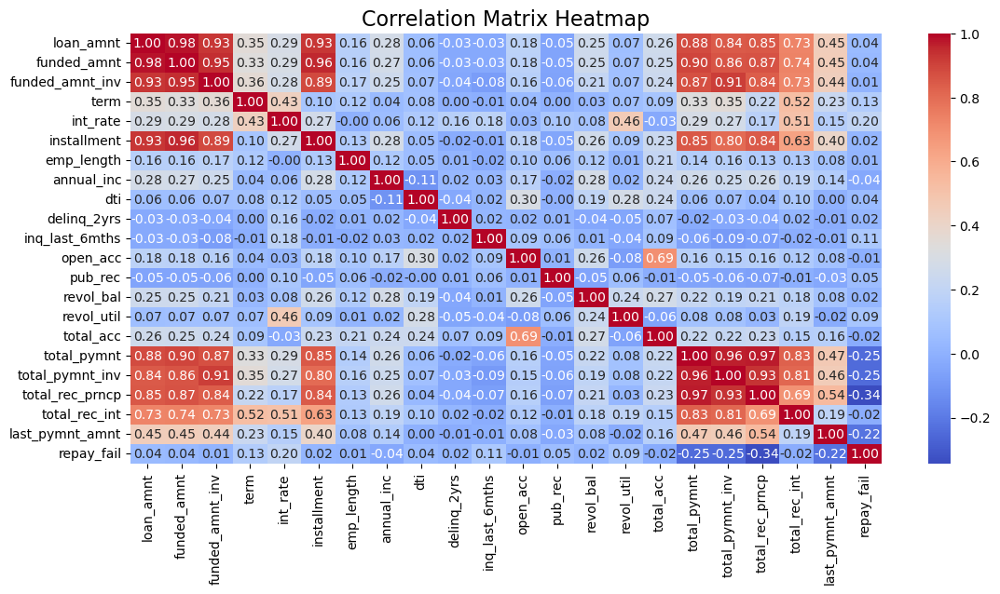

In [194]:
# Compute correlation matrix
corr_matrix = df.select_dtypes(include = 'number').corr()
# Plot heatmap
plt.figure(figsize=(13, 6))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f', annot_kws={"size": 10})
plt.title('Correlation Matrix Heatmap', fontsize=16)
plt.show()

In [195]:
df.isnull().sum()

loan_amnt                0
funded_amnt              0
funded_amnt_inv          0
term                     0
int_rate                 0
installment              0
emp_length             993
home_ownership           0
annual_inc               1
verification_status      0
issue_d                  0
loan_status              0
purpose                  0
addr_state               0
dti                      0
delinq_2yrs              0
earliest_cr_line         0
inq_last_6mths           0
open_acc                 0
pub_rec                  0
revol_bal                3
revol_util              59
total_acc                0
total_pymnt              0
total_pymnt_inv          0
total_rec_prncp          0
total_rec_int            0
last_pymnt_d            71
last_pymnt_amnt          0
last_credit_pull_d       3
repay_fail               0
dtype: int64

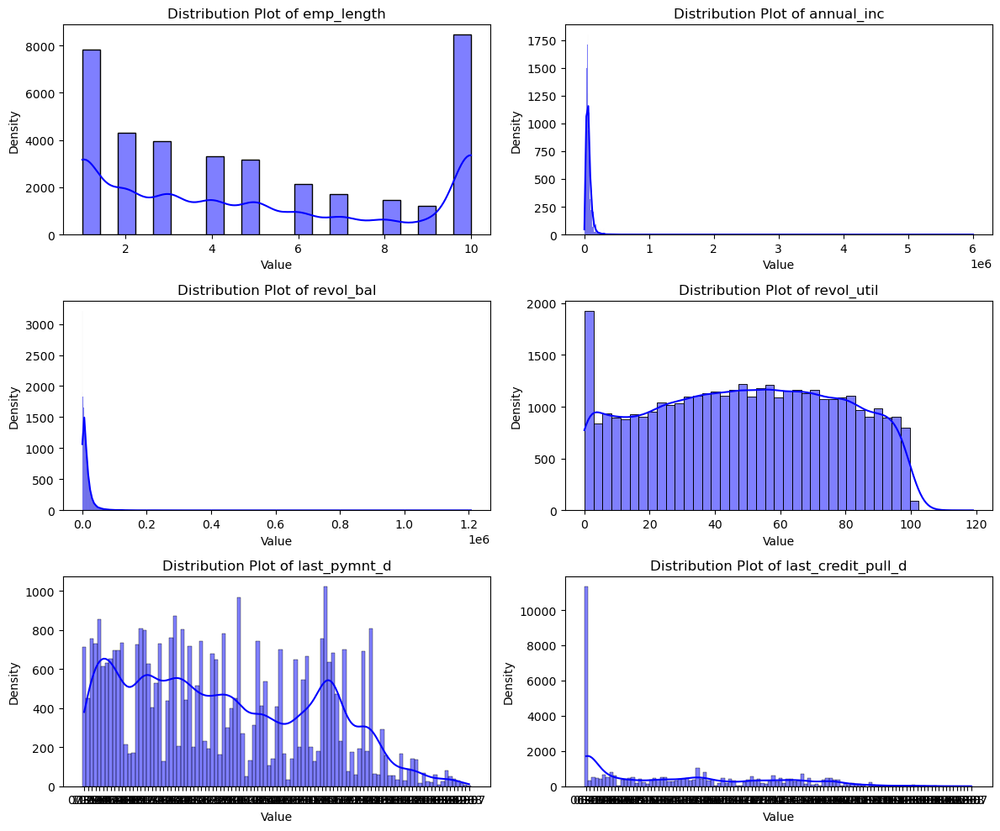

In [196]:
plt.figure(figsize=(12, 10)) 
columns_wih_missing_values = ['emp_length','annual_inc', 'revol_bal', 'revol_util', 'last_pymnt_d','last_credit_pull_d']

for i, col in enumerate(columns_wih_missing_values):
    plt.subplot(3, 2, i+1)  # Create subplots (3 rows, 2 columns), index i+1
    sns.histplot(df[col], kde=True, color='blue', edgecolor='black')
    plt.title(f'Distribution Plot of {col}')
    plt.xlabel('Value')
    plt.ylabel('Density')

plt.tight_layout()  # Adjust layout to prevent overlapping
plt.show()

**Missing value imputation :**

- 'annual_inc' has 1 missing value : imputation using 'mean' (since distribution seems normal)
- 'revol_bal' has 3 missing values : imputation using 'mean' (since distribution seems normal)
- 'last_credit_pull_d' has 3 missing values : imputation using 'mode' (since it is categorical variable)

In [197]:
df['annual_inc'].fillna(df['annual_inc'].mean(), inplace=True)
df['revol_bal'].fillna(df['revol_bal'].mean(), inplace=True)
df['last_credit_pull_d'].fillna(df['last_credit_pull_d'].mode(), inplace=True)

In [198]:
#df.isnull().sum()

#### Missing value imputation for the feature : 'emp_length'

In [199]:
df['emp_length'].describe()

count   37485.000000
mean        5.043938
std         3.408196
min         1.000000
25%         2.000000
50%         4.000000
75%         9.000000
max        10.000000
Name: emp_length, dtype: float64

**Conclusions :**
    
- Relationships with other features: 'emp_length' doesn't show significant correlations with other features so kNN imputation won't be good fit as it relies on relationship between features

- Distribution: Distribution of 'emp_length' shows peaks on both ends & follows a decreasing trend towards the center this suggesting non-normal distribution, possibly skewed

- Missing Values: Missing values are spread throughout the dataset rather than concentrated in specific areas
    
'Median' would be a better choice for imputation

In [200]:
df['emp_length'].fillna(df['emp_length'].median(), inplace=True)

<Axes: xlabel='emp_length', ylabel='Count'>

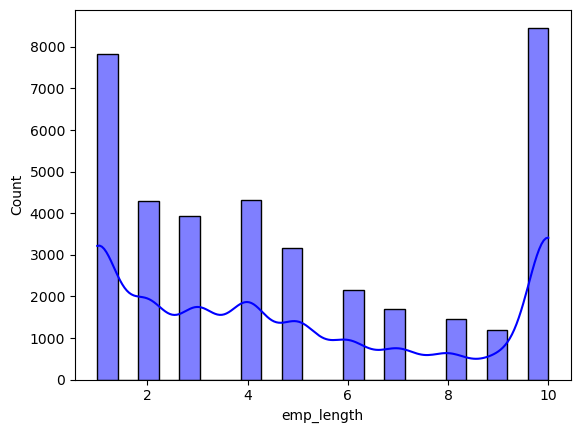

In [201]:
sns.histplot(df['emp_length'], kde=True, color='blue', edgecolor='black')

**Observation :**
    
- We can observe that the distribution plot of 'emp_length' doesn't change much after imputation of missing values with median        

#### Missing value imputation for the feature : 'revol_util' using mode

In [202]:
df['revol_util'].fillna(df['revol_util'].mode()[0], inplace=True)

<Axes: xlabel='revol_util', ylabel='Count'>

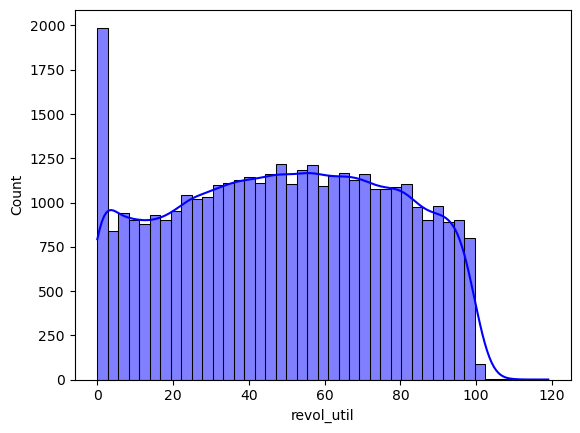

In [203]:
sns.histplot(df['revol_util'], kde=True, color='blue', edgecolor='black')

#### Missing value imputation for the feature : 'last_pymnt_d' , 'last_credit_pull_d' using mode

In [204]:
df['last_pymnt_d'].fillna(df['last_pymnt_d'].mode()[0], inplace=True)
df['last_credit_pull_d'].fillna(df['last_credit_pull_d'].mode()[0], inplace=True)

<Axes: xlabel='last_pymnt_d', ylabel='Count'>

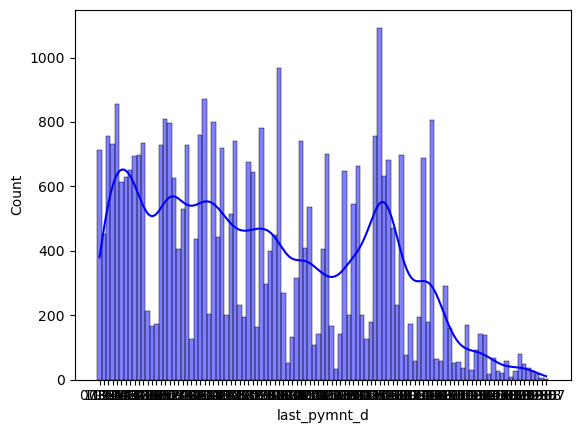

In [205]:
sns.histplot(df['last_pymnt_d'], kde=True, color='blue', edgecolor='black')

In [206]:
df.isnull().sum()

loan_amnt              0
funded_amnt            0
funded_amnt_inv        0
term                   0
int_rate               0
installment            0
emp_length             0
home_ownership         0
annual_inc             0
verification_status    0
issue_d                0
loan_status            0
purpose                0
addr_state             0
dti                    0
delinq_2yrs            0
earliest_cr_line       0
inq_last_6mths         0
open_acc               0
pub_rec                0
revol_bal              0
revol_util             0
total_acc              0
total_pymnt            0
total_pymnt_inv        0
total_rec_prncp        0
total_rec_int          0
last_pymnt_d           0
last_pymnt_amnt        0
last_credit_pull_d     0
repay_fail             0
dtype: int64

## OUTLIERS TREATMENT

#### Check for outliers in all the variables and treat them using appropriate techniques

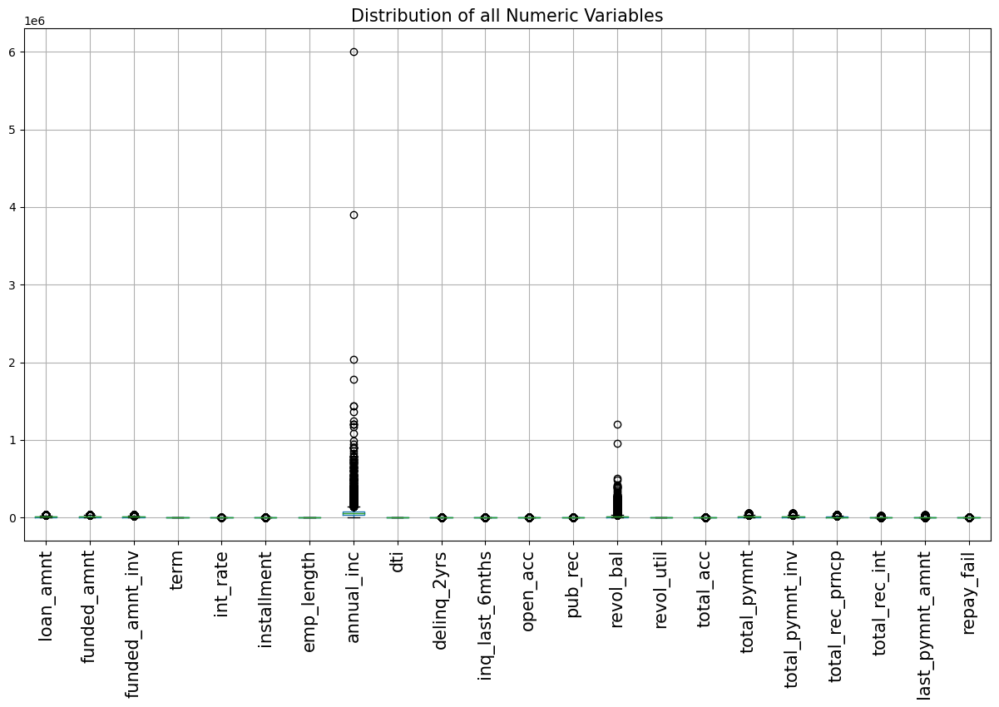

In [207]:
# Set the plot size using figure
# pass width and height in inches to 'figsize'
plt.figure(figsize = (15,8))

# Plot a boxplot to visualize the outliers in all the numeric variables
df.boxplot()

# Set the plot label
# Set text size using 'fontsize'
plt.title('Distribution of all Numeric Variables', fontsize = 15)
plt.xticks(rotation = 'vertical', fontsize = 15)
plt.show()

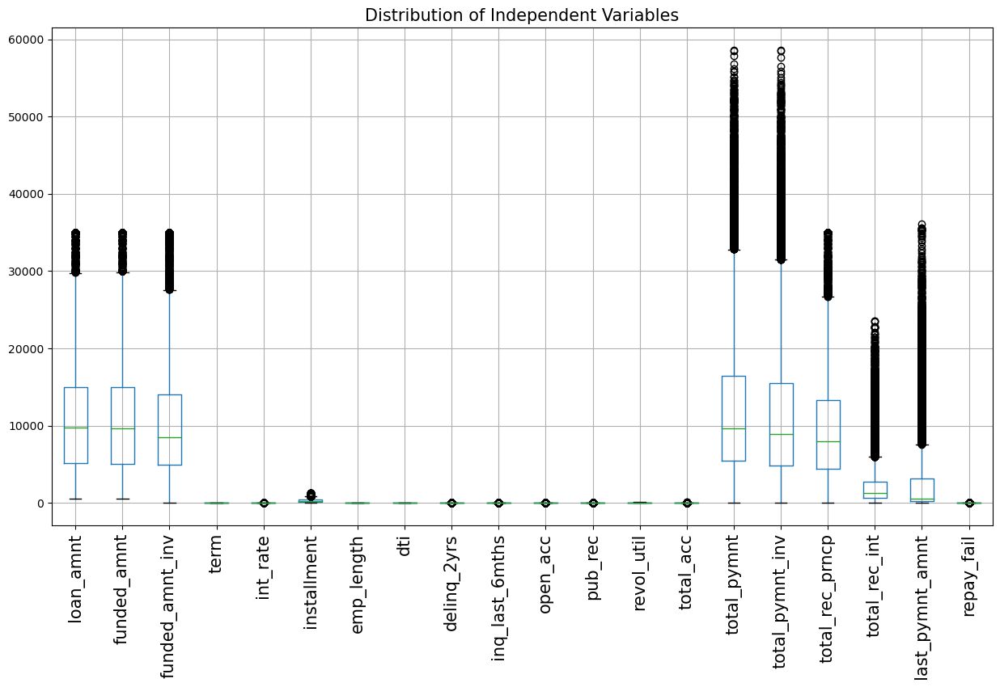

In [208]:
plt.figure(figsize = (15,8))
df.drop(['annual_inc','revol_bal'], axis=1).boxplot()
plt.title('Distribution of Independent Variables', fontsize = 15)
plt.xticks(rotation = 'vertical', fontsize = 15)
plt.show()

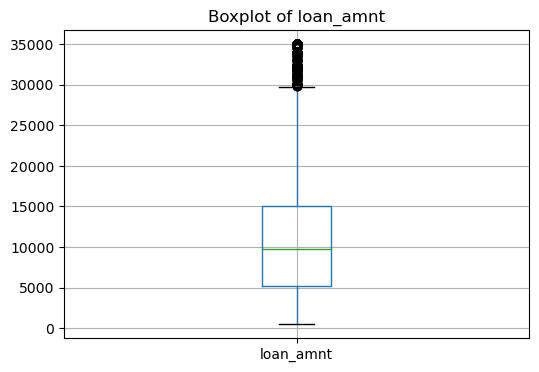

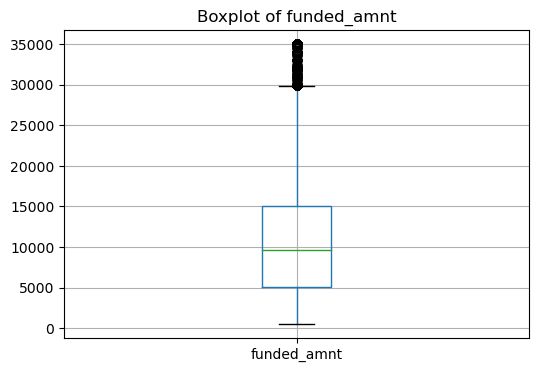

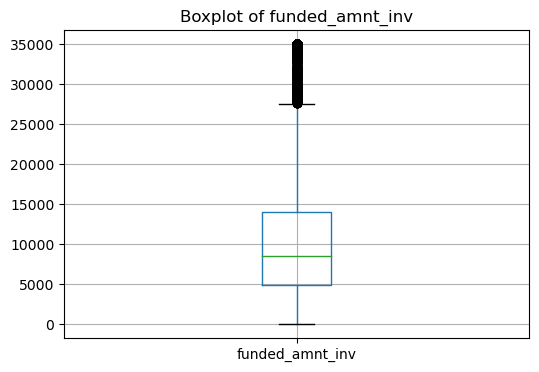

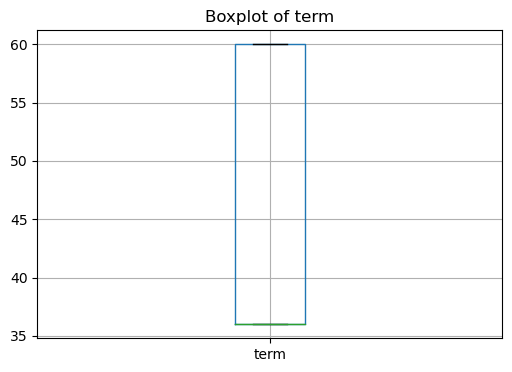

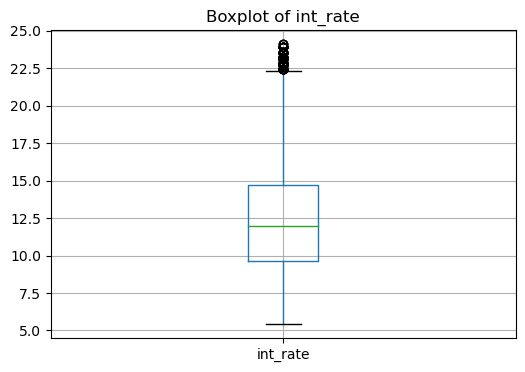

...

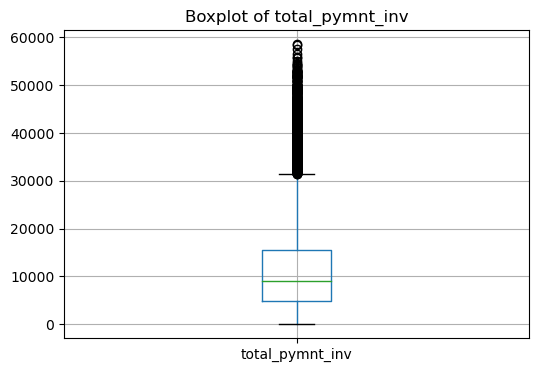

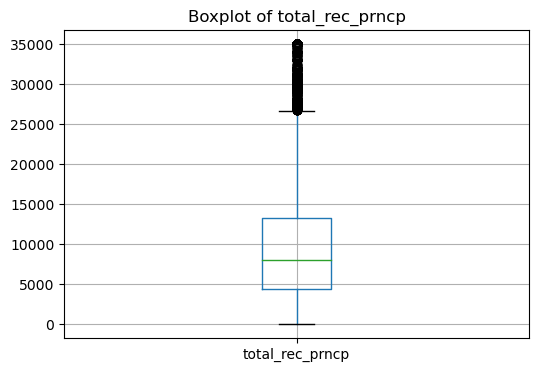

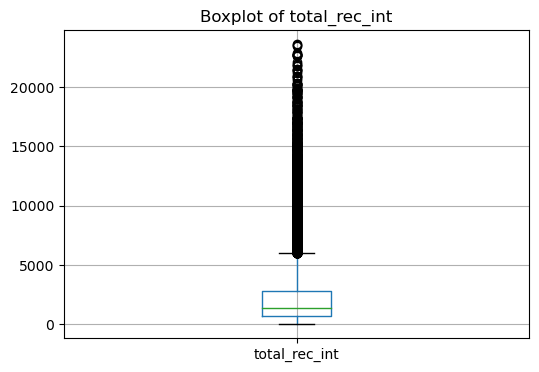

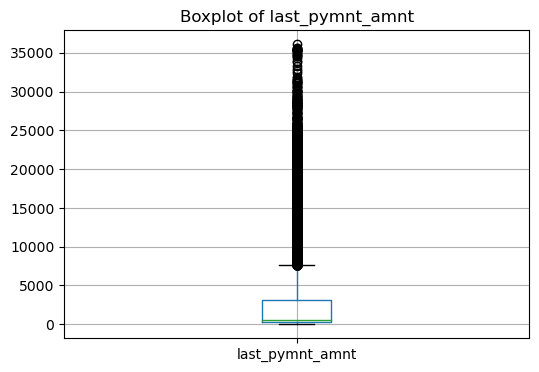

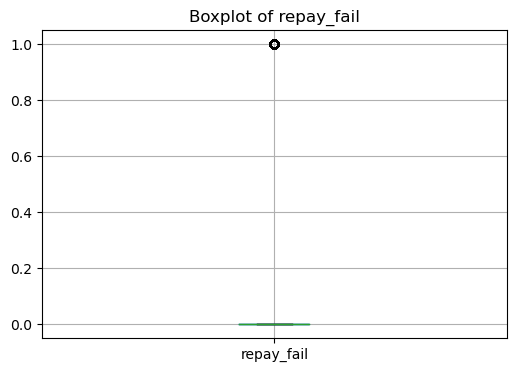

In [209]:
numerical_columns = df.select_dtypes(include=['number']).columns.tolist()

# Create individual boxplots for each numerical column
for column in numerical_columns:
    plt.figure(figsize=(6, 4))  # Adjust figure size as needed
    df.boxplot(column=[column])
    plt.title(f'Boxplot of {column}')
    plt.show()

## Analysing 'annual_inc' columns for outlier treatement

In [210]:
df['annual_inc'].describe()

count     38478.000000
mean      68997.102074
std       64475.429295
min        1896.000000
25%       40000.000000
50%       58650.000000
75%       82000.000000
max     6000000.000000
Name: annual_inc, dtype: float64

In [211]:
q90 = df['annual_inc'].quantile(0.90)
q91 = df['annual_inc'].quantile(0.91)
q92 = df['annual_inc'].quantile(0.92)
q93 = df['annual_inc'].quantile(0.93)
q94 = df['annual_inc'].quantile(0.94)
q95 = df['annual_inc'].quantile(0.95)
q96 = df['annual_inc'].quantile(0.96)
q97 = df['annual_inc'].quantile(0.97)
q98 = df['annual_inc'].quantile(0.98)
q99 = df['annual_inc'].quantile(0.99)
q100 = df['annual_inc'].quantile(1)

q_list = [q90,q91,q92,q93,q94,q95,q96,q97,q98,q99,q100]

print(q_list)


[116004.0, 120000.0, 124000.0, 129996.0, 135000.0, 144000.0, 151000.0, 170000.0, 192000.0, 240000.0, 6000000.0]


We can observe that there is a huge jump occuring from 99th percentile to 100th percentile

In [212]:
q990 = df['annual_inc'].quantile(0.990)
q991 = df['annual_inc'].quantile(0.991)
q992 = df['annual_inc'].quantile(0.992)
q993 = df['annual_inc'].quantile(0.993)
q994 = df['annual_inc'].quantile(0.994)
q995 = df['annual_inc'].quantile(0.995)
q996 = df['annual_inc'].quantile(0.996)
q997 = df['annual_inc'].quantile(0.997)
q998 = df['annual_inc'].quantile(0.998)
q999 = df['annual_inc'].quantile(0.999)
q1000 = df['annual_inc'].quantile(1)
 
q_list_1 = [q990,q991,q992,q993,q994,q995,q996,q997,q998,q999,q1000]

print(q_list_1)


[240000.0, 250000.0, 258184.0000000011, 275000.0, 294828.0000000377, 300000.0, 325014.9113599995, 370572.4480000031, 480000.0, 688097.8960000261, 6000000.0]


We can observe that there is a huge jump occuring between 0.991 to 1

#### Finding rows having outliers with huge jump in the valued

In [213]:
rows_having_jump = df[df['annual_inc'] > q999]['annual_inc'].index
print(rows_having_jump)
df[df['annual_inc']> q999]['annual_inc']

Index([  739,  2241,  2332,  4858,  5369,  6306,  6442,  8715,  9388,  9428,
       11023, 11501, 15890, 16901, 17282, 18169, 18474, 18573, 18783, 19950,
       23916, 24518, 25919, 26378, 28442, 30069, 30161, 30587, 30888, 31203,
       31904, 32028, 34982, 36208, 36429, 36867, 37293, 37691, 38342],
      dtype='int64')


739      948000.000000
2241     900000.000000
2332     900000.000000
4858     700053.850000
5369     700000.000000
6306    6000000.000000
6442     744000.000000
8715     708000.000000
9388     750000.000000
9428    1440000.000000
11023   1440000.000000
11501   1176000.000000
15890    860000.000000
16901    780000.000000
17282    900000.000000
18169   1782000.000000
18474   1200000.000000
18573    900000.000000
18783    756000.000000
19950   2039784.000000
23916    828000.000000
24518    780000.000000
25919    800000.000000
26378    780000.000000
28442    984000.000000
30069   3900000.000000
30161   1080000.000000
30587    780000.000000
30888   1250000.000000
31203   1200000.000000
31904    720000.000000
32028    720000.000000
34982    889000.000000
36208   1200000.000000
36429    750000.000000
36867    725000.000000
37293   1362000.000000
37691    700000.000000
38342    741600.000000
Name: annual_inc, dtype: float64

In [214]:
rows_having_jump1 = df[df['annual_inc'] > 1000000]['annual_inc'].index
print(rows_having_jump1)
df[df['annual_inc']> 1000000]['annual_inc']

Index([ 6306,  9428, 11023, 11501, 18169, 18474, 19950, 30069, 30161, 30888,
       31203, 36208, 37293],
      dtype='int64')


6306    6000000.000000
9428    1440000.000000
11023   1440000.000000
11501   1176000.000000
18169   1782000.000000
18474   1200000.000000
19950   2039784.000000
30069   3900000.000000
30161   1080000.000000
30888   1250000.000000
31203   1200000.000000
36208   1200000.000000
37293   1362000.000000
Name: annual_inc, dtype: float64

### Dropping rows with extreme outliers

In [215]:
# Drop rows where annual_inc > 1000000
df.drop(rows_having_jump1, inplace=True)

# Reset index 
df.reset_index(drop=True, inplace=True)

In [216]:
df.shape

(38465, 31)

### Capping off : Substituting values for outliers with min value among the remaining outliers

In [217]:
df[df['annual_inc'] > q999]['annual_inc'].min()

700000.0

In [218]:
min_outlier_value = df[df['annual_inc'] > q999]['annual_inc'].min()
df.loc[df['annual_inc'] > q999, 'annual_inc'] = min_outlier_value

In [219]:
#df[df['annual_inc']> q999]['annual_inc']

## Analysing 'revol_bal' columns for outlier treatement

In [220]:
df['revol_bal'].describe()

count     38465.000000
mean      14285.401734
std       21930.258651
min           0.000000
25%        3641.000000
50%        8840.000000
75%       17264.000000
max     1207359.000000
Name: revol_bal, dtype: float64

In [221]:
q90_rb = df['revol_bal'].quantile(0.90)
q91_rb = df['revol_bal'].quantile(0.91)
q92_rb = df['revol_bal'].quantile(0.92)
q93_rb = df['revol_bal'].quantile(0.93)
q94_rb = df['revol_bal'].quantile(0.94)
q95_rb = df['revol_bal'].quantile(0.95)
q96_rb = df['revol_bal'].quantile(0.96)
q97_rb = df['revol_bal'].quantile(0.97)
q98_rb = df['revol_bal'].quantile(0.98)
q99_rb = df['revol_bal'].quantile(0.99)
q100_rb = df['revol_bal'].quantile(1)

q_list_rb = [q90_rb,q91_rb,q92_rb,q93_rb,q94_rb,q95_rb,q96_rb,q97_rb,q98_rb,q99_rb,q100_rb]

print(q_list_rb)


[30333.199999999997, 32214.19999999999, 34405.20000000007, 36973.120000000024, 40263.75999999996, 44304.19999999994, 50314.91999999991, 58452.80000000002, 71874.04000000007, 98731.4800000001, 1207359.0]


We can observe that there is a huge jump occuring b/w 0.98 & 0.99, 0.99 & 1 

#### Finding rows having outliers with huge jump in the valued

In [222]:
rows_having_jump_rb = df[df['revol_bal'] > q98_rb]['revol_bal'].index
print(rows_having_jump_rb)
df[df['revol_bal']> q98_rb]['revol_bal']

Index([   39,    68,   115,   131,   215,   236,   242,   248,   259,   271,
       ...
       37977, 38094, 38105, 38138, 38191, 38279, 38289, 38407, 38439, 38445],
      dtype='int64', length=770)


39        98433.000000
68       229908.000000
115       82445.000000
131       91266.000000
215      116063.000000
236      112875.000000
242      191315.000000
248      290341.000000
259       92755.000000
271      110856.000000
318      137661.000000
319       88391.000000
325      105424.000000
328      133856.000000
399      124225.000000
478      311616.000000
552       79792.000000
629       86516.000000
769       86469.000000
787      111792.000000
816       85035.000000
858       97885.000000
926      374487.000000
957       83434.000000
982      124784.000000
1028     204954.000000
1098     111307.000000
1213     110886.000000
1251      75395.000000
1399      94905.000000
1416      96262.000000
1451     120830.000000
1509      81617.000000
1531     105245.000000
1546      79419.000000
1624     385489.000000
1659     156798.000000
1699      88150.000000
1716     401941.000000
1841     114629.000000
1922     119420.000000
1932      87649.000000
1973     100030.000000
2023     12

In [223]:
len(df[df['revol_bal']> q98_rb]['revol_bal'])

770

In [224]:
df[df['revol_bal'] > 1000000]['revol_bal']

16988   1207359.000000
Name: revol_bal, dtype: float64

In [225]:
a1 = df[df['revol_bal'] > 1000000]['revol_bal']

In [226]:
df.drop(df[df['revol_bal'] > 1000000].index, inplace=True)
# Reset index 
df.reset_index(drop=True, inplace=True)

In [227]:
df.shape

(38464, 31)

In [228]:
df[df['revol_bal']> q98_rb]['revol_bal'].min()

71890.0

### Capping off : Substituting values for outliers with min value among the outliers

In [229]:
min_outlier_value_rb = df[df['revol_bal'] > q98_rb]['revol_bal'].min()
df.loc[df['revol_bal'] > q98_rb, 'revol_bal'] = min_outlier_value_rb

In [230]:
#df[df['revol_bal']> q98_rb]['revol_bal']

## CONVERT DATATYPE OF DATE COLUMNS INTO DATETIME

In [231]:
def convert_to_datetime(date_str):
    return pd.to_datetime(date_str, format='%m-%y', errors='coerce')

# Apply the conversion function to all date columns
date_columns = ['issue_d', 'earliest_cr_line', 'last_pymnt_d', 'last_credit_pull_d']
for col in date_columns:
    df[col] = df[col].apply(convert_to_datetime)

In [232]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 38464 entries, 0 to 38463
Data columns (total 31 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   loan_amnt            38464 non-null  float64       
 1   funded_amnt          38464 non-null  float64       
 2   funded_amnt_inv      38464 non-null  float64       
 3   term                 38464 non-null  int64         
 4   int_rate             38464 non-null  float64       
 5   installment          38464 non-null  float64       
 6   emp_length           38464 non-null  float64       
 7   home_ownership       38464 non-null  object        
 8   annual_inc           38464 non-null  float64       
 9   verification_status  38464 non-null  object        
 10  issue_d              38464 non-null  datetime64[ns]
 11  loan_status          38464 non-null  object        
 12  purpose              38464 non-null  object        
 13  addr_state           38464 non-

## HANDLING DATETIME COLUMNS IN A SEPARATE DATAFRAME

In [233]:
datetime_columns = df.select_dtypes(include=['datetime'])
datetime_columns.head()

,issue_d,earliest_cr_line,last_pymnt_d,last_credit_pull_d
0,2010-07-01,2005-08-01,2013-07-01,2016-06-01
1,2010-06-01,1994-04-01,2011-11-01,2012-03-01
2,2011-09-01,1998-03-01,2014-03-01,2014-03-01
3,2011-09-01,1975-01-01,2014-02-01,2016-06-01
4,2010-04-01,1998-04-01,2013-05-01,2016-06-01


## ENCODING THE CATEGORICAL VARIABLES

In [234]:
df.select_dtypes(include = 'object').columns

Index(['home_ownership', 'verification_status', 'loan_status', 'purpose',
       'addr_state'],
      dtype='object')

In [235]:
df.select_dtypes(include = 'object').nunique()

home_ownership          5
verification_status     3
loan_status             9
purpose                14
addr_state             50
dtype: int64

**Steps :**
    
- 'home_ownership', 'verification_status', 'loan_status', 'purpose'  : One-Hot Encoding
    
- 'addr_state'  : Target Encoding  

### DUMMY ENCODING

In [236]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 38464 entries, 0 to 38463
Data columns (total 31 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   loan_amnt            38464 non-null  float64       
 1   funded_amnt          38464 non-null  float64       
 2   funded_amnt_inv      38464 non-null  float64       
 3   term                 38464 non-null  int64         
 4   int_rate             38464 non-null  float64       
 5   installment          38464 non-null  float64       
 6   emp_length           38464 non-null  float64       
 7   home_ownership       38464 non-null  object        
 8   annual_inc           38464 non-null  float64       
 9   verification_status  38464 non-null  object        
 10  issue_d              38464 non-null  datetime64[ns]
 11  loan_status          38464 non-null  object        
 12  purpose              38464 non-null  object        
 13  addr_state           38464 non-

#### Convert 'term'  to object datatype

In [237]:
df['term'] = df['term'].astype(object)

In [238]:
# store the target variable 'Attrition' in a dataframe 'df_target'
df_target = df['repay_fail']

# store all the independent variables in a dataframe 'df_feature' except datetime columns
df_feature = df.drop(['issue_d', 'earliest_cr_line', 'last_pymnt_d', 'last_credit_pull_d','repay_fail'],axis=1)

In [239]:
# filter the categorical features in the dataset
df_cat = df_feature.select_dtypes(include = 'O')

df_cat.columns

Index(['term', 'home_ownership', 'verification_status', 'loan_status',
       'purpose', 'addr_state'],
      dtype='object')

In [240]:
df_cat_dummy = df_cat.drop(columns=['addr_state'])
df_cat_target = df_cat['addr_state']

In [241]:
# use 'get_dummies' from pandas to create dummy variables
dummy_var = pd.get_dummies(data = df_cat_dummy, drop_first = True).astype('float')

In [242]:
dummy_var.head()

,term_60,home_ownership_NONE,home_ownership_OTHER,home_ownership_OWN,home_ownership_RENT,verification_status_Source Verified,verification_status_Verified,loan_status_Current,loan_status_Default,loan_status_Does not meet the credit policy. Status:Charged Off,loan_status_Does not meet the credit policy. Status:Fully Paid,loan_status_Fully Paid,loan_status_In Grace Period,loan_status_Late (16-30 days),loan_status_Late (31-120 days),purpose_credit_card,purpose_debt_consolidation,purpose_educational,purpose_home_improvement,purpose_house,purpose_major_purchase,purpose_medical,purpose_moving,purpose_other,purpose_renewable_energy,purpose_small_business,purpose_vacation,purpose_wedding
0,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
1,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
3,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000


In [243]:
dummy_var.shape

(38464, 28)

### TARGET ENCODING

In [244]:
#pip install category_encoders

In [245]:
from category_encoders import TargetEncoder

# Apply target encoding
target_encoder = TargetEncoder()
addr_state_encoded = target_encoder.fit_transform(df['addr_state'], df['repay_fail'])

# Convert the encoded column to a DataFrame
addr_state_encoded_df = pd.DataFrame(addr_state_encoded, columns=['addr_state_encoded'])

In [246]:
addr_state_encoded.head()

,addr_state
0,0.147100
1,0.136794
2,0.131029
3,0.136794
4,0.127563


## SCALING 

In [247]:
# filter the numerical features in the dataset
df_num = df_feature.select_dtypes(include = [np.number])

df_num.columns

Index(['loan_amnt', 'funded_amnt', 'funded_amnt_inv', 'int_rate',
       'installment', 'emp_length', 'annual_inc', 'dti', 'delinq_2yrs',
       'inq_last_6mths', 'open_acc', 'pub_rec', 'revol_bal', 'revol_util',
       'total_acc', 'total_pymnt', 'total_pymnt_inv', 'total_rec_prncp',
       'total_rec_int', 'last_pymnt_amnt'],
      dtype='object')

In [248]:
# initialize the standard scalar
x_scaler = StandardScaler()

# scale all the numerical columns
num_scaled = x_scaler.fit_transform(df_num)

# create a dataframe of scaled numerical variables
df_num_scaled = pd.DataFrame(num_scaled, columns = df_num.columns)
df_num_scaled.head()

,loan_amnt,funded_amnt,funded_amnt_inv,int_rate,installment,emp_length,annual_inc,dti,delinq_2yrs,inq_last_6mths,open_acc,pub_rec,revol_bal,revol_util,total_acc,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,last_pymnt_amnt
0,-1.160613,-1.165810,-1.073246,0.489977,-1.137114,-0.301838,-1.017548,0.963278,-0.299296,2.551736,-0.520962,-0.235705,-0.843468,-0.976801,-1.044822,-0.988790,-0.916518,-1.013415,-0.644862,-0.574602
1,-0.822999,-0.815990,-0.722504,1.021052,-0.705435,-0.301838,-0.195860,0.920170,-0.299296,-0.054684,-0.520962,-0.235705,0.370726,1.791309,-0.613373,-1.002840,-0.930662,-1.097222,-0.528711,-0.555290
2,-0.552908,-0.536135,-0.441910,-0.607219,-0.466708,1.479779,-0.305514,-0.383478,5.610408,1.248526,-0.520962,-0.235705,-0.687326,-0.064663,-0.181925,-0.432823,-0.356808,-0.375269,-0.447554,-0.242324
3,-1.228135,-1.235774,-1.143395,-1.817639,-1.257171,1.479779,-0.806922,-1.453747,-0.299296,-0.706289,-0.520962,-0.235705,-0.910415,-1.726938,-0.613373,-1.090236,-1.018647,-1.084321,-0.805802,-0.583192
4,-1.012063,-1.011889,-0.918920,-0.515561,-0.988024,1.479779,12.784939,-1.758476,-0.299296,1.900131,-0.298648,-0.235705,-0.910415,-1.726938,0.249523,-0.863238,-0.790121,-0.857424,-0.632902,-0.561875


In [249]:
df_num_scaled.shape

(38464, 20)

### CONCATENATE SCALED NUMERICAL AND ENCODED CATEGORICAL VARIABLES

In [250]:
df_num_scaled.reset_index(drop=True, inplace=True)
dummy_var.reset_index(drop=True, inplace=True)
addr_state_encoded.reset_index(drop=True, inplace=True)

In [251]:
# concat the encoded categorical variables with scaled numeric features to create a dataframe of all independent variables
x = pd.concat([df_num_scaled, dummy_var,addr_state_encoded], axis = 1)

x.head()

,loan_amnt,funded_amnt,funded_amnt_inv,int_rate,installment,emp_length,annual_inc,dti,delinq_2yrs,inq_last_6mths,open_acc,pub_rec,revol_bal,revol_util,total_acc,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,last_pymnt_amnt,term_60,home_ownership_NONE,home_ownership_OTHER,home_ownership_OWN,home_ownership_RENT,verification_status_Source Verified,verification_status_Verified,loan_status_Current,loan_status_Default,loan_status_Does not meet the credit policy. Status:Charged Off,loan_status_Does not meet the credit policy. Status:Fully Paid,loan_status_Fully Paid,loan_status_In Grace Period,loan_status_Late (16-30 days),loan_status_Late (31-120 days),purpose_credit_card,purpose_debt_consolidation,purpose_educational,purpose_home_improvement,purpose_house,purpose_major_purchase,purpose_medical,purpose_moving,purpose_other,purpose_renewable_energy,purpose_small_business,purpose_vacation,purpose_wedding,addr_state
0,-1.160613,-1.165810,-1.073246,0.489977,-1.137114,-0.301838,-1.017548,0.963278,-0.299296,2.551736,-0.520962,-0.235705,-0.843468,-0.976801,-1.044822,-0.988790,-0.916518,-1.013415,-0.644862,-0.574602,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.147100
1,-0.822999,-0.815990,-0.722504,1.021052,-0.705435,-0.301838,-0.195860,0.920170,-0.299296,-0.054684,-0.520962,-0.235705,0.370726,1.791309,-0.613373,-1.002840,-0.930662,-1.097222,-0.528711,-0.555290,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.136794
2,-0.552908,-0.536135,-0.441910,-0.607219,-0.466708,1.479779,-0.305514,-0.383478,5.610408,1.248526,-0.520962,-0.235705,-0.687326,-0.064663,-0.181925,-0.432823,-0.356808,-0.375269,-0.447554,-0.242324,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.131029
3,-1.228135,-1.235774,-1.143395,-1.817639,-1.257171,1.479779,-0.806922,-1.453747,-0.299296,-0.706289,-0.520962,-0.235705,-0.910415,-1.726938,-0.613373,-1.090236,-1.018647,-1.084321,-0.805802,-0.583192,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.136794
4,-1.012063,-1.011889,-0.918920,-0.515561,-0.988024,1.479779,12.784939,-1.758476,-0.299296,1.900131,-0.298648,-0.235705,-0.910415,-1.726938,0.249523,-0.863238,-0.790121,-0.857424,-0.632902,-0.561875,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.127563


In [252]:
x.shape

(38464, 49)

In [253]:
y = df_target

In [254]:
y.head()

0    0
1    1
2    0
3    0
4    0
Name: repay_fail, dtype: int64

In [255]:
y.shape

(38464,)

## TARGET VARIABLE : 'repay_fail'

In [256]:
df['repay_fail'].value_counts(normalize = True)

repay_fail
0   0.848534
1   0.151466
Name: proportion, dtype: float64

<Axes: xlabel='repay_fail'>

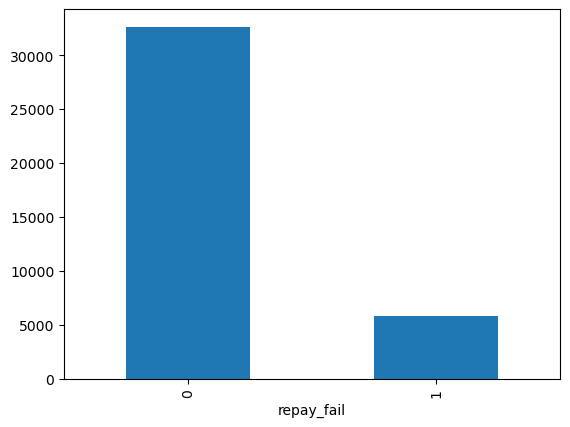

In [257]:
pd.value_counts(y).plot.bar()

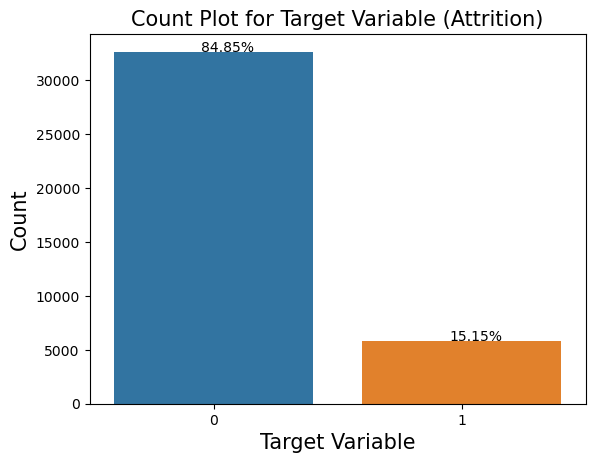

In [258]:
df_target = df['repay_fail'].copy()
df_target.value_counts()
sns.countplot(x=df_target)
plt.text(x = -0.05, y = df_target.value_counts()[0] + 1, s = str(round((df_target.value_counts()[0])*100/len(df_target),2)) + '%')
plt.text(x = 0.95, y = df_target.value_counts()[1] +1, s = str(round((df_target.value_counts()[1])*100/len(df_target),2)) + '%')

plt.title('Count Plot for Target Variable (Attrition)', fontsize = 15)
plt.xlabel('Target Variable', fontsize = 15)
plt.ylabel('Count', fontsize = 15)

plt.show()

## HANDLING IMBALANCED DATA USING SMOTE

In [259]:
# #Apply SMOTE to balance the classes
# from imblearn.over_sampling import SMOTE
# smote = SMOTE(random_state=42)
# x, y = smote.fit_resample(x, y)

In [260]:
# pd.value_counts(y).plot.bar()

In [ ]:
# Note : Not used the SMOTE technique as it is causing singular matrix error

## TRAIN-TEST SPLIT

In [261]:
x = sm.add_constant(x)

x_train, x_test, y_train, y_test = train_test_split(x,y, random_state = 1, test_size = 0.3)

print('x_train', x_train.shape)
print('y_train', y_train.shape)
print('x_test', x_test.shape)
print('y_test', y_test.shape)

x_train (26924, 50)
y_train (26924,)
x_test (11540, 50)
y_test (11540,)


#### Create a generalized function to create a dataframe containing the scores for the models.

In [262]:
# create an empty dataframe to store the scores for various algorithms
score_card = pd.DataFrame(columns=['Probability Cutoff', 'AUC Score', 'Precision Score', 'Recall Score',
                                       'Accuracy Score', 'Kappa Score', 'f1-score'])

# append the result table for all performance scores
def update_score_card(model, cutoff):
    
    # let 'y_pred_prob' be the predicted values of y
    y_pred_prob = logreg.predict(x_test)

    # convert probabilities to 0 and 1 using 'if_else'
    y_pred = [ 0 if x < cutoff else 1 for x in y_pred_prob]
    
    # assign 'score_card' as global variable
    global score_card

    # append the results to the dataframe 'score_card'
    # 'ignore_index = True' do not consider the index labels
    score_card = score_card.apply({'Probability Cutoff': cutoff,
                                    'AUC Score' : metrics.roc_auc_score(y_test, y_pred),
                                    'Precision Score': metrics.precision_score(y_test, y_pred),
                                    'Recall Score': metrics.recall_score(y_test, y_pred),
                                    'Accuracy Score': metrics.accuracy_score(y_test, y_pred),
                                    'Kappa Score':metrics.cohen_kappa_score(y_test, y_pred),
                                    'f1-score': metrics.f1_score(y_test, y_pred)}, 
                                    ignore_index = True)

## MODEL BUILDING

## Logistic Regression (Full Model)

In [282]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

In [114]:
import warnings
warnings.filterwarnings('ignore')

In [117]:
# x.reset_index(drop=True, inplace=True)
# y.reset_index(drop=True, inplace=True)

In [263]:
# build the model on train data (x_train and y_train)
# use fit() to fit the logistic regression model
logreg = sm.Logit(y_train, x_train).fit()

# print the summary of the model
print(logreg.summary())

         Current function value: 0.000010
         Iterations: 35
                           Logit Regression Results                           
Dep. Variable:             repay_fail   No. Observations:                26924
Model:                          Logit   Df Residuals:                    26874
Method:                           MLE   Df Model:                           49
Date:                Wed, 17 Jul 2024   Pseudo R-squ.:                   1.000
Time:                        05:07:45   Log-Likelihood:               -0.26394
converged:                      False   LL-Null:                       -11420.
Covariance Type:            nonrobust   LLR p-value:                     0.000
                                                                      coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------------------------------------
const                                 

In [275]:
from scipy.stats import norm

# Assuming 'logreg' is your fitted logistic regression model
# Compute standard errors for coefficients
se = np.sqrt(np.diag(logreg.cov_params()))

# Calculate Z-scores
z_scores = logreg.params / se

# Set the desired confidence level (e.g., 95%)
confidence_level = 0.95
alpha = 1 - confidence_level

# Compute critical Z-value for two-tailed test
z_critical = norm.ppf(1 - alpha / 2)

# Calculate confidence intervals
lower_bounds = logreg.params - z_critical * se
upper_bounds = logreg.params + z_critical * se

# Create a DataFrame to display the intervals
coef_intervals_df = pd.DataFrame({
    'Feature': x_train.columns,
    'Coefficient': logreg.params,
    'Lower Bound': lower_bounds,
    'Upper Bound': upper_bounds
})

In [274]:
coef_intervals_df

,Feature,Coefficient,Lower Bound,Upper Bound
const,const,18.487359,-757.112329,794.087048
loan_amnt,loan_amnt,6.602671,-32.110820,45.316162
funded_amnt,funded_amnt,-13.568062,-192.076940,164.940817
funded_amnt_inv,funded_amnt_inv,5.392823,-138.591690,149.377337
int_rate,int_rate,-1.924895,-27.879939,24.030149
installment,installment,4.085862,-133.667227,141.838950
emp_length,emp_length,-0.219578,-9.972383,9.533226
annual_inc,annual_inc,0.626994,-9.363529,10.617517
dti,dti,-0.396702,-10.899601,10.106197
delinq_2yrs,delinq_2yrs,0.090287,-7.593928,7.774503


In [277]:
scaler = StandardScaler()
x_train_scaled = scaler.fit_transform(x_train)
x_test_scaled = scaler.transform(x_test)

In [278]:
model = LogisticRegression()

<IPython.core.display.Javascript object>

In [279]:
model.fit(x_train_scaled, y_train)

LogisticRegression()

In [280]:
y_pred = model.predict(x_test_scaled)

In [283]:
accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy}')

Accuracy: 1.0


In [284]:
print('Confusion Matrix:')
print(confusion_matrix(y_test, y_pred))

Confusion Matrix:
[[9775    0]
 [   0 1765]]


In [285]:
print('Classification Report:')
print(classification_report(y_test, y_pred))

Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      9775
           1       1.00      1.00      1.00      1765

    accuracy                           1.00     11540
   macro avg       1.00      1.00      1.00     11540
weighted avg       1.00      1.00      1.00     11540



## VARIANCE INFLATION FACTOR

In [276]:
# create an empty dataframe to store the VIF for each variable
vif = pd.DataFrame()

# calculate VIF using list comprehension 
# use for loop to access each variable 
# calculate VIF for each variable and create a column 'VIF_Factor' to store the values 
vif["VIF_Factor"] = [variance_inflation_factor(x.values, i) for i in range(x.shape[1])]
                                               
# create a column of variable names
vif["Features"] = x.columns  

# sort the dataframe based on the values of VIF_Factor in descending order
# 'ascending = False' sorts the data in descending order
# 'reset_index' resets the index of the dataframe
# 'drop = True' drops the previous index
vif.sort_values('VIF_Factor', ascending = False).reset_index(drop = True)

,VIF_Factor,Features
0,265.390833,total_pymnt
1,158.046698,funded_amnt
2,110.527431,total_rec_prncp
3,107.037192,total_pymnt_inv
4,97.918012,const
5,75.795930,funded_amnt_inv
6,52.186853,installment
7,29.251737,loan_amnt
8,21.927010,total_rec_int
9,7.468678,purpose_debt_consolidation


In [286]:
for a in range(len(x.columns)):
    df_vif=pd.DataFrame()    
    df_vif['VIF']=[variance_inflation_factor(x.values,i) for i in range(x.shape[1])]    
    df_vif['Feature']=x.columns    
    multi=df_vif[df_vif['VIF']>5]    
    if multi.empty is False:
        df_sorted= multi.sort_values(by='VIF',ascending=False)
    else:
        print(df_vif)
        break        
    if df_sorted.empty is False:
        x.drop(df_sorted['Feature'].iloc[0],axis=1, inplace=True)    
print(x.columns)

        VIF                                            Feature
0  3.261460                                    funded_amnt_inv
1  2.245271                                           int_rate
2  1.131743                                         emp_length
3  1.515980                                         annual_inc
4  1.381069                                                dti
5  1.087837                                        delinq_2yrs
6  1.502270                                     inq_last_6mths
7  2.167801                                           open_acc
8  1.037511                                            pub_rec
9  1.704144                                          revol_bal
10 1.823288                                         revol_util
11 2.345730                                          total_acc
12 3.434557                                      total_rec_int
13 1.407861                                    last_pymnt_amnt
14 2.166574                                            

In [287]:
scaler = StandardScaler()
x_train_scaled = scaler.fit_transform(x_train)
x_test_scaled = scaler.transform(x_test)

In [288]:
model = LogisticRegression()

In [289]:
model.fit(x_train_scaled, y_train)

LogisticRegression()

In [290]:
y_pred = model.predict(x_test_scaled)

In [291]:
accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy}')

Accuracy: 1.0


In [292]:
print('Confusion Matrix:')
print(confusion_matrix(y_test, y_pred))

Confusion Matrix:
[[9775    0]
 [   0 1765]]


In [293]:
print('Classification Report:')
print(classification_report(y_test, y_pred))

Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      9775
           1       1.00      1.00      1.00      1765

    accuracy                           1.00     11540
   macro avg       1.00      1.00      1.00     11540
weighted avg       1.00      1.00      1.00     11540



### LOGISTIC REGRESSION REGULARIZATION MODEL

In [308]:
from sklearn.linear_model import LogisticRegression

# Apply L2 regularization (Ridge)
logreg_l2 = LogisticRegression(penalty='l2', solver='liblinear')
logreg_l2.fit(x_train, y_train)
print("Logistic Regression with L2 regularization Training Accuracy:", logreg_l2.score(x_train, y_train))
print("Logistic Regression with L2 regularization Test Accuracy:", logreg_l2.score(x_test, y_test))

# Apply L1 regularization (Lasso)
logreg_l1 = LogisticRegression(penalty='l1', solver='liblinear')
logreg_l1.fit(x_train, y_train)
print("Logistic Regression with L1 regularization Training Accuracy:", logreg_l1.score(x_train, y_train))
print("Logistic Regression with L1 regularization Test Accuracy:", logreg_l1.score(x_test, y_test))

Logistic Regression with L2 regularization Training Accuracy: 0.8991606002079928
Logistic Regression with L2 regularization Test Accuracy: 0.9006932409012132
Logistic Regression with L1 regularization Training Accuracy: 0.8996062992125984
Logistic Regression with L1 regularization Test Accuracy: 0.901473136915078


In [312]:
# Predict on the test set
y_pred = logreg_l2.predict(x_test)

In [316]:
# Generate the confusion matrix
cm = confusion_matrix(y_test, y_pred)
cm

array([[9617,  158],
       [ 988,  777]])

In [317]:
# Assigning TN,TP,FP,FN
TN = cm[0,0]
TP = cm[1,1]
FP = cm[0,1]
FN = cm[1,0]

### Compute various performance metrics

In [318]:
# Calculate the precision value
precision = TP/(TP+FP)
precision

0.8310160427807487

In [319]:
# Calculate the recall value
recall = TP/(TP+FN)
recall

0.44022662889518416

In [320]:
# Calculate the specificity value
specificity = TN/(TN+FP)
specificity

0.9838363171355499

In [321]:
# Calculate f1 score
f1_score = 2*((precision*recall)/(precision+recall))
f1_score

0.5755555555555556

In [322]:
# Calculate the accuracy
accuracy = (TN+TP)/(TN+FP+FN+TP)
accuracy

0.9006932409012132

In [323]:
# Calculate various performance measures
acc_table = classification_report(y_test,y_pred)
print(acc_table)

              precision    recall  f1-score   support

           0       0.91      0.98      0.94      9775
           1       0.83      0.44      0.58      1765

    accuracy                           0.90     11540
   macro avg       0.87      0.71      0.76     11540
weighted avg       0.90      0.90      0.89     11540



## DECISION TREE MODEL

### CART DECISION TREE ALGORITHM

In [295]:
# import various functions from sklearn
from sklearn.metrics import classification_report
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn import tree
from sklearn.model_selection import GridSearchCV

# %pip install pydotplus
# import the functions for visualizing the decision tree
import pydotplus
from IPython.display import Image  

In [296]:
# set the plot size using 'rcParams'
plt.rcParams['figure.figsize'] = [15,8]

### DISTRIBUTION OF VARIABLES

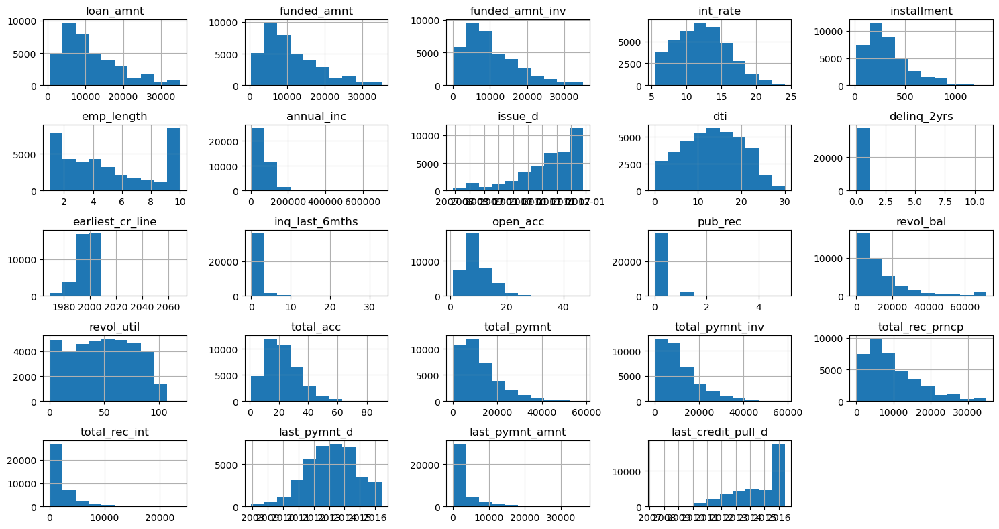

In [297]:
# for the independent numeric variables, we plot the histogram to check the distribution of the variables
df.drop('repay_fail', axis = 1).hist()
plt.tight_layout()

plt.show()  


In [298]:
# print the skewness for each numeric independent variable
print('Skewness:')
df_num.skew()

Skewness:


loan_amnt          1.064421
funded_amnt        1.083993
funded_amnt_inv    1.104939
int_rate           0.234563
installment        1.123267
emp_length         0.350662
annual_inc         4.403231
dti               -0.030790
delinq_2yrs        5.143743
inq_last_6mths     3.536625
open_acc           1.038694
pub_rec            4.664812
revol_bal          2.140131
revol_util        -0.041150
total_acc          0.823300
total_pymnt        1.347775
total_pymnt_inv    1.362510
total_rec_prncp    1.122240
total_rec_int      2.702192
last_pymnt_amnt    2.747095
dtype: float64

### Train-Test Split

In [299]:
# split data into train subset and test subset
# set 'random_state' to generate the same dataset each time you run the code 
# 'test_size' returns the proportion of data to be included in the test set
x_train, x_test, y_train, y_test = train_test_split(x, y, random_state = 1, test_size = 0.3)


print('x_train', x_train.shape)
print('y_train', y_train.shape)


print('x_test', x_test.shape)
print('y_test', y_test.shape)

x_train (26924, 41)
y_train (26924,)
x_test (11540, 41)
y_test (11540,)


#### Create a generalized function to calculate the metrics for the train and the test set.

In [300]:
# create a generalized function to calculate the metrics values for train set
def get_train_report(model):
    
    # for training set:
    # train_pred: prediction made by the model on the train dataset 'X_train'
    # y_train: actual values of the target variable for the train dataset

    # predict the output of the target variable from the train data 
    train_pred = model.predict(x_train)

    # return the performace measures on train set
    return(classification_report(y_train, train_pred))

In [301]:
# create a generalized function to calculate the metrics values for test set
def get_test_report(model):
    
    # for test set:
    # test_pred: prediction made by the model on the test dataset 'X_test'
    # y_test: actual values of the target variable for the test dataset

    # predict the output of the target variable from the test data 
    test_pred = model.predict(x_test)

    # return the performace measures on test set
    return(classification_report(y_test, test_pred))

### Decision Tree for Classification

In [302]:
# instantiate the 'DecisionTreeClassifier' object using 'entropy' criterion
# pass the 'random_state' to obtain the same samples for each time you run the code
decision_tree_classification = DecisionTreeClassifier(criterion = 'gini', random_state = 1)

# fit the model using fit() on train data
decision_tree = decision_tree_classification.fit(x_train, y_train)

**Plot a decision tree**

To visualize our decision tree we will use Graphviz. If you are an anaconda user then install it by using conda install graphviz otherwise write the command pip install graphviz.

In [303]:
# save the column names in 'labels'
labels = x_train.columns

# export a decision tree in DOT format
# pass the 'decision_tree' to export it to Graphviz
# pass the column names to 'feature_names'
# pass the required class labels to 'class_names'
dot_data = tree.export_graphviz(decision_tree, feature_names = labels, class_names = ["0","1"])  

# plot the decision tree using DOT format in 'dot_data'
graph = pydotplus.graph_from_dot_data(dot_data)  

# display the decision tree
Image(graph.create_png())

# double-click on the image below to get an expanded view

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.379055 to fit



### OVER FITTING IN DECISION TREE

The decision tree is said to be over-fitted if it tries to perfectly fit all the observations in the training data. We can calculate the difference between the train and test accuracy to identify if there is over-fitting.

In [305]:
# compute the performance measures on train data
# call the function 'get_train_report'
# pass the decision tree to the function
train_report = get_train_report(decision_tree)

print(train_report)

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     22863
           1       1.00      1.00      1.00      4061

    accuracy                           1.00     26924
   macro avg       1.00      1.00      1.00     26924
weighted avg       1.00      1.00      1.00     26924



#### Calculate performance measures on the test set.

In [306]:
# compute the performance measures on test data
# call the function 'get_test_report'
# pass the decision tree to the function
test_report = get_test_report(decision_tree)

print(test_report)

              precision    recall  f1-score   support

           0       0.94      0.93      0.94      9775
           1       0.65      0.66      0.65      1765

    accuracy                           0.89     11540
   macro avg       0.79      0.80      0.80     11540
weighted avg       0.89      0.89      0.89     11540



If we tune the hyperparameters in the decision tree, it helps to avoid the over-fitting of the tree

#### Build a decision tree using 'criterion = gini', 'max_depth = 5', 'min_samples_split = 4', 'max_leaf_nodes = 6'

In [307]:
# pass the criteria 'gini' to the parameter, 'criterion' 
# max_depth: that assigns maximum depth of the tree
# min_samples_split: assigns minimum number of samples to split an internal node
# max_leaf_nodes': assigns maximum number of leaf nodes in the tree
# pass the 'random_state' to obtain the same samples for each time you run the code
dt_model = DecisionTreeClassifier(criterion = 'gini',
                                  max_depth = 5,
                                  min_samples_split = 4,
                                  max_leaf_nodes = 6,
                                  random_state = 10)

# fit the model using fit() on train data
decision_tree = dt_model.fit(x_train, y_train)


train_report = get_train_report(decision_tree)

# print the performance measures
print('Train data:\n', train_report)


test_report = get_test_report(decision_tree)

# print the performance measures
print('Test data:\n', test_report)

Train data:
               precision    recall  f1-score   support

           0       0.91      0.94      0.93     22863
           1       0.59      0.48      0.53      4061

    accuracy                           0.87     26924
   macro avg       0.75      0.71      0.73     26924
weighted avg       0.86      0.87      0.87     26924

Test data:
               precision    recall  f1-score   support

           0       0.91      0.94      0.93      9775
           1       0.60      0.49      0.54      1765

    accuracy                           0.87     11540
   macro avg       0.76      0.72      0.73     11540
weighted avg       0.86      0.87      0.87     11540



## Random Forest for Classification

In [329]:
# instantiate the 'RandomForestClassifier'
# pass the required number of trees in the random forest to the parameter, 'n_estimators'
# pass the 'random_state' to obtain the same samples for each time you run the code
rf_classification = RandomForestClassifier(n_estimators = 10, random_state = 1)

# use fit() to fit the model on the train set
rf_model = rf_classification.fit(x_train, y_train)

#### Calculate performance measures on the train set.

In [330]:
train_report = get_train_report(rf_model)

# print the performace measures
print(train_report) 

              precision    recall  f1-score   support

           0       0.99      1.00      0.99     22863
           1       1.00      0.94      0.97      4061

    accuracy                           0.99     26924
   macro avg       0.99      0.97      0.98     26924
weighted avg       0.99      0.99      0.99     26924



#### Calculate performance measures on the test set

In [331]:
test_report = get_test_report(rf_model)

# print the performace measures
print(test_report) 

              precision    recall  f1-score   support

           0       0.91      0.98      0.94      9775
           1       0.83      0.44      0.57      1765

    accuracy                           0.90     11540
   macro avg       0.87      0.71      0.76     11540
weighted avg       0.90      0.90      0.89     11540



## XGBoost

In [355]:
# Install XGBoost (if not already installed)
!pip install xgboost

# Import necessary libraries
import xgboost as xgb
from xgboost import XGBClassifier
from sklearn.metrics import confusion_matrix

# Initialize the XGBoost classifier
xgb_model = XGBClassifier()

# Train the model
xgb_model.fit(x_train, y_train)

# Predict using the test data
y_pred = xgb_model.predict(x_test)

# Accuracy score
accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy:.2f}')

# Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print('Confusion Matrix:')
print(conf_matrix)

# Classification Report
class_report = classification_report(y_test, y_pred)
print('Classification Report:')
print(class_report)

Accuracy: 0.93
Confusion Matrix:
[[9616  159]
 [ 618 1147]]
Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.98      0.96      9775
           1       0.88      0.65      0.75      1765

    accuracy                           0.93     11540
   macro avg       0.91      0.82      0.85     11540
weighted avg       0.93      0.93      0.93     11540



## CROSS VALIDATION

In [356]:
from sklearn.model_selection import cross_val_score

In [358]:
cv_reg_log =cross_val_score(LogisticRegression(),x,y,cv=5)
cv_reg_log.sort()
cv_reg_log*100

array([89.71792539, 89.86091252, 89.87391135, 90.12088912, 90.15860634])

In [359]:
cv_ran_for = cross_val_score(RandomForestClassifier(),x,y,cv=5)
cv_ran_for.sort()
cv_ran_for*100

array([90.86182244, 90.96581308, 91.03080723, 91.12179904, 91.14664587])

In [360]:
cv_dec_tree = cross_val_score(DecisionTreeClassifier(),x,y,cv=5)
cv_dec_tree.sort()
cv_dec_tree*100

array([89.96490316, 90.04289614, 90.23660946, 90.27687508, 90.51085402])

In [361]:
cv_xgboost = cross_val_score(XGBClassifier(),x,y,cv=5)
cv_xgboost.sort()
cv_xgboost*100

array([93.07072283, 93.18861302, 93.20161185, 93.25360718, 93.48758612])

In [362]:
# Cross-validation scores for Logistic Regression
cv_reg_log = cross_val_score(LogisticRegression(), x, y, cv=5)
avg_reg_log = cv_reg_log.mean()

# Cross-validation scores for Random Forest
cv_ran_for = cross_val_score(RandomForestClassifier(), x, y, cv=5)
avg_ran_for = cv_ran_for.mean()

# Cross-validation scores for Decision Tree
cv_dec_tree = cross_val_score(DecisionTreeClassifier(), x, y, cv=5)
avg_dec_tree = cv_dec_tree.mean()

# Cross-validation scores for XGBoost
cv_xgboost = cross_val_score(XGBClassifier(), x, y, cv=5)
avg_xgboost = cv_xgboost.mean()

# Print average scores
print(f"Average cross-validation score for Logistic Regression: {avg_reg_log}")
print(f"Average cross-validation score for Random Forest: {avg_ran_for}")
print(f"Average cross-validation score for Decision Tree: {avg_dec_tree}")
print(f"Average cross-validation score for XGBoost: {avg_xgboost}")

# Determine the best model based on average scores
best_model = max({
    "Logistic Regression": avg_reg_log,
    "Random Forest": avg_ran_for,
    "Decision Tree": avg_dec_tree,
    "XGBoost": avg_xgboost
}.items(), key=lambda x: x[1])

print(f"The best model is {best_model[0]} with an average cross-validation score of {best_model[1]}")

Average cross-validation score for Logistic Regression: 0.8994644894336004
Average cross-validation score for Random Forest: 0.9107477240724882
Average cross-validation score for Decision Tree: 0.9019343415098883
Average cross-validation score for XGBoost: 0.9324042820025552
The best model is XGBoost with an average cross-validation score of 0.9324042820025552
